# 주식 데이터 분석
- 삼성전자
- 두산퓨얼셀
- 현대차
- KT
- 종근당홀딩스
- 오뚜기
- 더존비즈온

In [104]:
import numpy as np 
import pandas as pd 
import seaborn as sns 
import matplotlib as mpl 
import matplotlib.pyplot as plt 
%matplotlib inline
# 한글폰트 사용
mpl.rc('font', family='Malgun Gothic')
mpl.rc('axes', unicode_minus=False)

In [105]:
import warnings
warnings.filterwarnings("ignore")

In [106]:
from fbprophet import Prophet
from datetime import datetime
import pandas_datareader as pdr

### ① 삼성전자

In [107]:
start = datetime(2013, 1, 1)
end = datetime(2020, 12, 4)
samsung = pdr.DataReader('005930.KS', data_source='yahoo', start=start, end=end)
samsung.head()

,High,Low,Open,Close,Volume,Adj Close
Date,,,,,,
2013-01-02,31520.0,30540.0,30660.0,31520.0,11449650.0,41.799534
2013-01-03,31680.0,30860.0,31640.0,30860.0,14227400.0,40.924290
2013-01-04,30840.0,30200.0,30800.0,30500.0,12999800.0,40.446884
2013-01-07,30560.0,30000.0,30300.0,30400.0,12610950.0,40.314274
2013-01-08,30340.0,29960.0,30260.0,30000.0,13822250.0,39.783821


In [108]:
samsung.tail()

,High,Low,Open,Close,Volume,Adj Close
Date,,,,,,
2020-11-30,68600.0,66700.0,68400.0,66700.0,43811016.0,66700.0
2020-12-01,68300.0,67100.0,67100.0,67800.0,22327173.0,67800.0
2020-12-02,69900.0,68300.0,68400.0,69500.0,29703942.0,69500.0
2020-12-03,70500.0,69300.0,70100.0,69700.0,23677989.0,69700.0
2020-12-04,72100.0,70100.0,70400.0,71500.0,28130533.0,71500.0


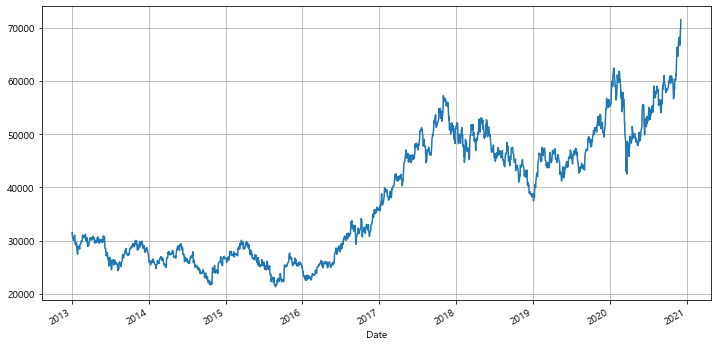

In [109]:
samsung.Close.plot(figsize=(12,6), grid=True)
plt.show()

In [110]:
samsung_trunc = samsung[:'2020-06-30']
samsung_trunc.tail()

,High,Low,Open,Close,Volume,Adj Close
Date,,,,,,
2020-06-24,53900.0,51600.0,51900.0,52900.0,24519552.0,52900.0
2020-06-25,53000.0,51900.0,52100.0,51900.0,18541624.0,51900.0
2020-06-26,53900.0,52200.0,52800.0,53300.0,21575360.0,53300.0
2020-06-29,53200.0,52000.0,52500.0,52400.0,17776925.0,52400.0
2020-06-30,53900.0,52800.0,53900.0,52800.0,21157172.0,52800.0


In [111]:
df1 = pd.DataFrame({'ds': samsung_trunc.index, 'y': samsung_trunc.Close})
df1.reset_index(inplace=True)
del df1['Date']
df1.head()

,ds,y
0,2013-01-02,31520.0
1,2013-01-03,30860.0
2,2013-01-04,30500.0
3,2013-01-07,30400.0
4,2013-01-08,30000.0


In [112]:
model = Prophet(daily_seasonality=True)
model.fit(df1)

In [113]:
future = model.make_future_dataframe(periods=157)
future.tail()

,ds
1988,2020-11-30
1989,2020-12-01
1990,2020-12-02
1991,2020-12-03
1992,2020-12-04


In [114]:
forecast = model.predict(future)

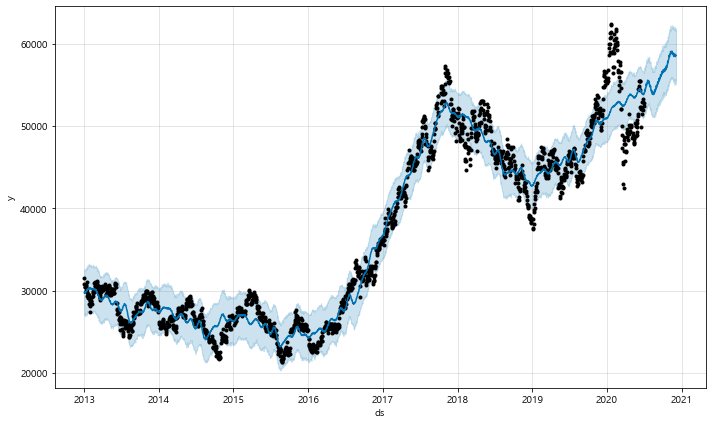

In [115]:
model.plot(forecast);

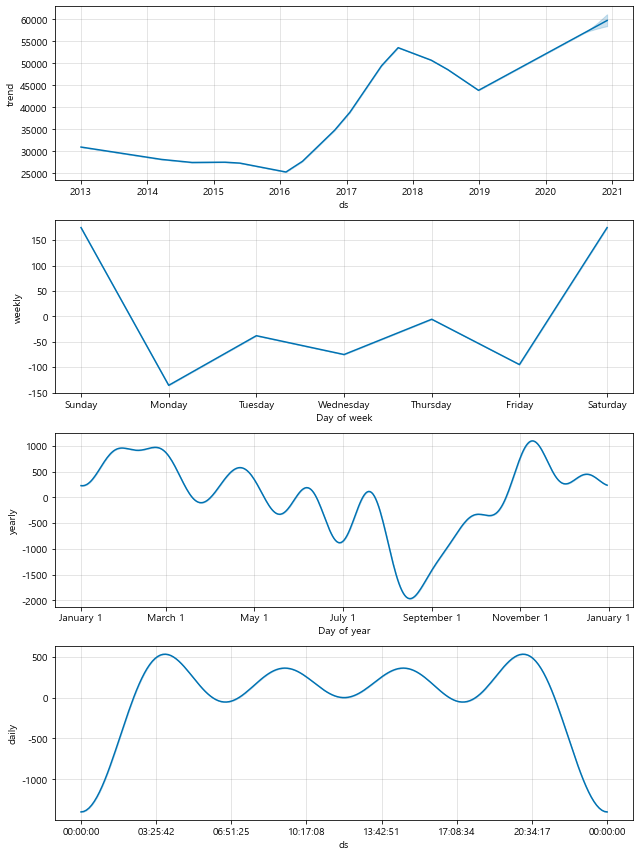

In [116]:
model.plot_components(forecast);

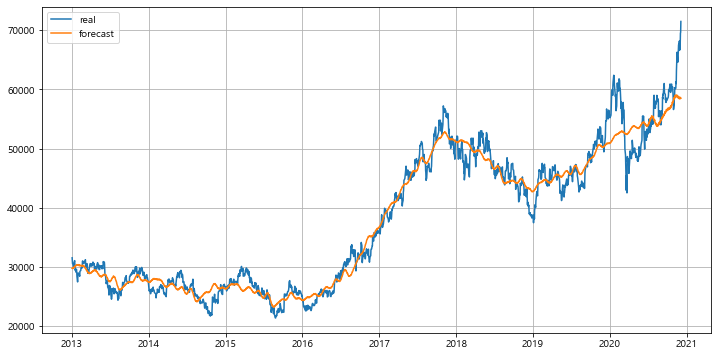

In [117]:
plt.figure(figsize=(12,6))
plt.plot(samsung.index, samsung.Close, label='real')
plt.plot(forecast.ds, forecast.yhat, label='forecast')
plt.grid()
plt.legend()
plt.show()

### ② 두산퓨얼셀

In [118]:
start = datetime(2013, 1, 1)
end = datetime(2020, 12, 4)
dusan = pdr.DataReader('336260.KS', data_source='yahoo', start=start, end=end)
dusan.head()

,High,Low,Open,Close,Volume,Adj Close
Date,,,,,,
2019-10-18,5510.0,4240.0,4240.0,5510.0,370645.0,5510.0
2019-10-21,7160.0,6670.0,6970.0,7160.0,21919889.0,7160.0
2019-10-22,9300.0,7290.0,7700.0,8930.0,39020768.0,8930.0
2019-10-23,10300.0,7510.0,9780.0,7930.0,28203889.0,7930.0
2019-10-24,9170.0,7320.0,7700.0,7800.0,34906548.0,7800.0


- 상장일이 19.10.18 부터입니다

In [119]:
dusan.tail()

,High,Low,Open,Close,Volume,Adj Close
Date,,,,,,
2020-11-30,49900.0,47350.0,49200.0,49900.0,1303574.0,49900.0
2020-12-01,49700.0,47500.0,49300.0,47850.0,1109690.0,47850.0
2020-12-02,47800.0,45900.0,47800.0,46400.0,1568810.0,46400.0
2020-12-03,46100.0,41800.0,46050.0,43900.0,2675120.0,43900.0
2020-12-04,45200.0,43000.0,43750.0,44200.0,1126031.0,44200.0


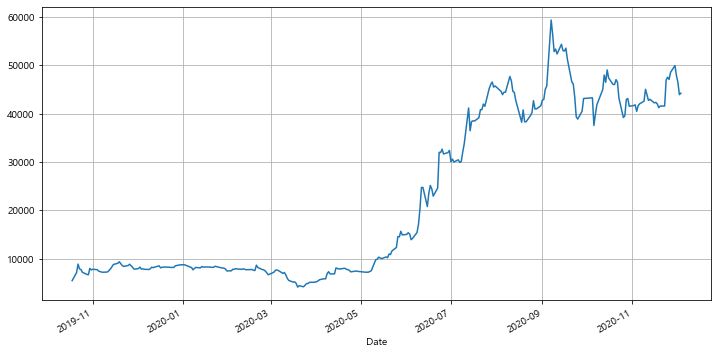

In [120]:
dusan.Close.plot(figsize=(12,6), grid=True)
plt.show()

In [121]:
dusan_trunc = dusan[:'2020-10-31']
dusan_trunc.tail()

,High,Low,Open,Close,Volume,Adj Close
Date,,,,,,
2020-10-26,41136.398438,39172.898438,40547.398438,39172.898438,1671687.0,39172.898438
2020-10-27,42000.000000,38950.000000,39550.000000,39550.000000,1666171.0,39550.000000
2020-10-28,43200.000000,39900.000000,40000.000000,42900.000000,1112963.0,42900.000000
2020-10-29,43250.000000,41100.000000,41500.000000,43100.000000,957940.0,43100.000000
2020-10-30,43750.000000,41200.000000,43300.000000,41500.000000,710980.0,41500.000000


In [122]:
df2 = pd.DataFrame({'ds': dusan_trunc.index, 'y': dusan_trunc.Close})
df2.reset_index(inplace=True)
del df2['Date']
df2.head()

,ds,y
0,2019-10-18,5510.0
1,2019-10-21,7160.0
2,2019-10-22,8930.0
3,2019-10-23,7930.0
4,2019-10-24,7800.0


In [123]:
model = Prophet(daily_seasonality=True)
model.fit(df2)

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


In [124]:
future = model.make_future_dataframe(periods=35)
future.tail()

,ds
286,2020-11-30
287,2020-12-01
288,2020-12-02
289,2020-12-03
290,2020-12-04


In [125]:
forecast = model.predict(future)

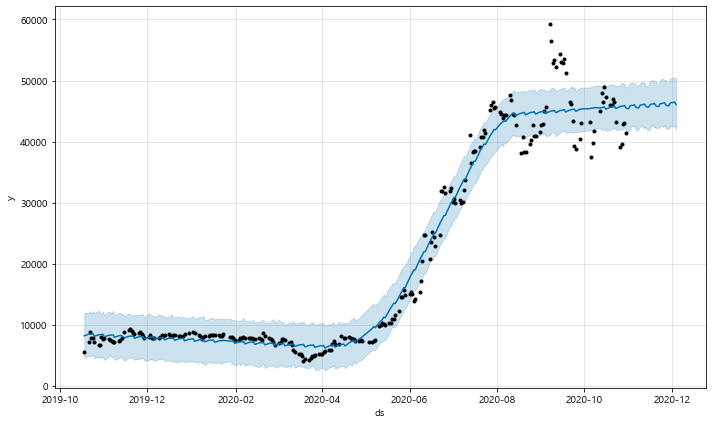

In [126]:
model.plot(forecast);

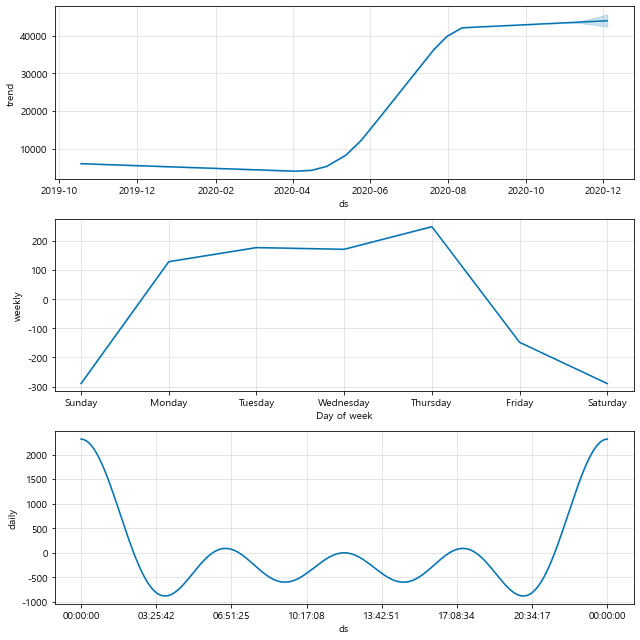

In [127]:
model.plot_components(forecast);

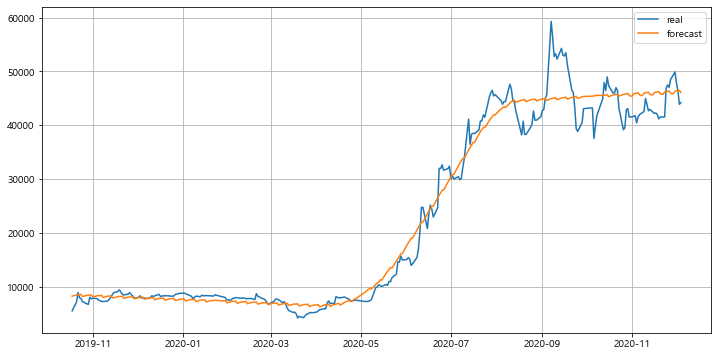

In [128]:
plt.figure(figsize=(12,6))
plt.plot(dusan.index, dusan.Close, label='real')
plt.plot(forecast.ds, forecast.yhat, label='forecast')
plt.grid()
plt.legend()
plt.show()

### ③ 현대차

In [129]:
start = datetime(2013, 1, 1)
end = datetime(2020, 12, 4)
hyundai = pdr.DataReader('005380.KS', data_source='yahoo', start=start, end=end)
hyundai.head()

,High,Low,Open,Close,Volume,Adj Close
Date,,,,,,
2013-01-02,220500.0,215000.0,220500.0,216000.0,696026.0,187619.31250
2013-01-03,216500.0,202500.0,216000.0,206000.0,1758280.0,178933.25000
2013-01-04,207500.0,202500.0,204500.0,206000.0,1026707.0,178933.25000
2013-01-07,209500.0,205500.0,205500.0,208500.0,775886.0,181104.78125
2013-01-08,212500.0,208500.0,209000.0,210000.0,539799.0,182407.68750


In [130]:
hyundai.tail()

,High,Low,Open,Close,Volume,Adj Close
Date,,,,,,
2020-11-30,188500.0,181500.0,181500.0,181500.0,3981271.0,181500.0
2020-12-01,184500.0,179500.0,183000.0,183500.0,1792800.0,183500.0
2020-12-02,184500.0,181500.0,183500.0,182500.0,1745795.0,182500.0
2020-12-03,196500.0,182000.0,183500.0,196500.0,6053809.0,196500.0
2020-12-04,199000.0,195000.0,198000.0,196500.0,3224702.0,196500.0


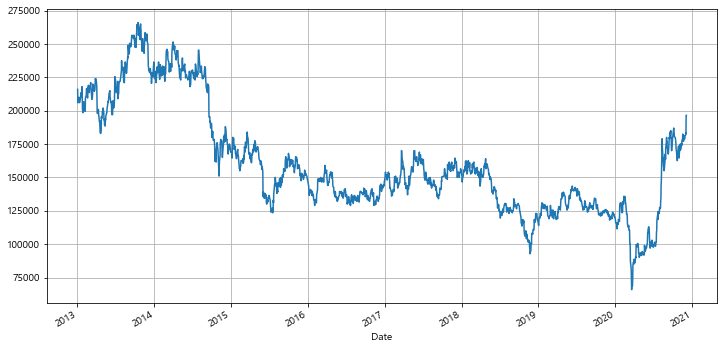

In [131]:
hyundai.Close.plot(figsize=(12,6), grid=True)
plt.show()

In [132]:
hyundai_trunc = hyundai[:'2020-06-30']
hyundai_trunc.tail()

,High,Low,Open,Close,Volume,Adj Close
Date,,,,,,
2020-06-24,103500.0,99800.0,100000.0,103000.0,1813817.0,103000.0
2020-06-25,101000.0,99400.0,100500.0,99400.0,1084453.0,99400.0
2020-06-26,101000.0,99500.0,100500.0,100000.0,670161.0,100000.0
2020-06-29,98700.0,97600.0,97700.0,97700.0,943424.0,97700.0
2020-06-30,99300.0,97700.0,99100.0,97700.0,988987.0,97700.0


In [133]:
df3 = pd.DataFrame({'ds': hyundai_trunc.index, 'y': hyundai_trunc.Close})
df3.reset_index(inplace=True)
del df3['Date']
df3.head()

,ds,y
0,2013-01-02,216000.0
1,2013-01-03,206000.0
2,2013-01-04,206000.0
3,2013-01-07,208500.0
4,2013-01-08,210000.0


In [134]:
model = Prophet(daily_seasonality=True)
model.fit(df3)

In [135]:
future = model.make_future_dataframe(periods=157)
future.tail()

,ds
1988,2020-11-30
1989,2020-12-01
1990,2020-12-02
1991,2020-12-03
1992,2020-12-04


In [136]:
forecast = model.predict(future)

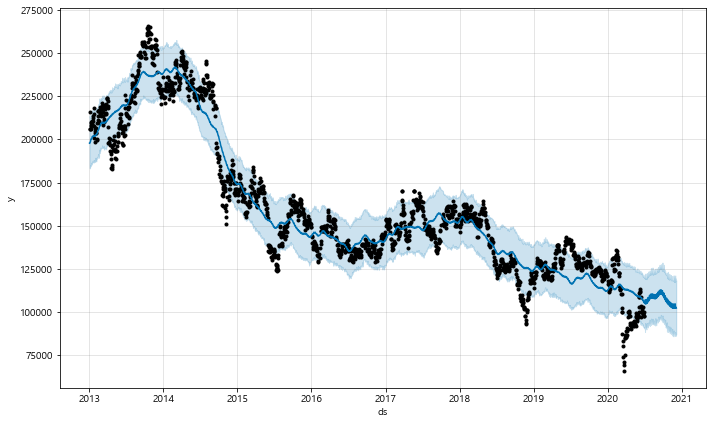

In [137]:
model.plot(forecast);

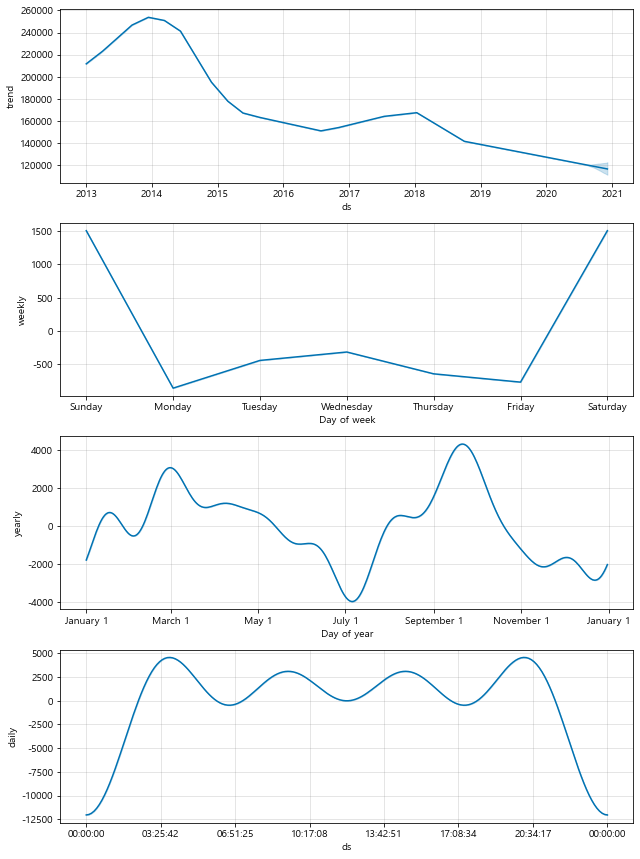

In [138]:
model.plot_components(forecast);

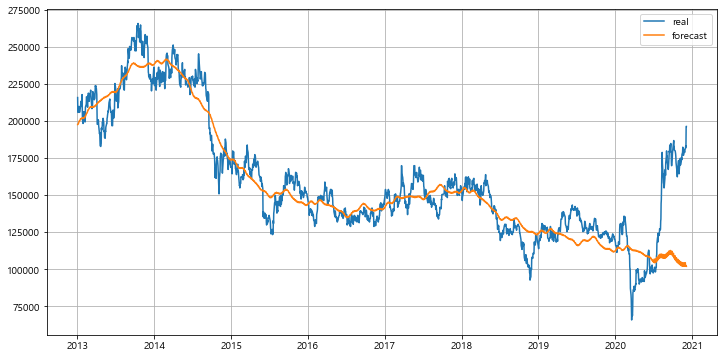

In [139]:
plt.figure(figsize=(12,6))
plt.plot(hyundai.index, hyundai.Close, label='real')
plt.plot(forecast.ds, forecast.yhat, label='forecast')
plt.grid()
plt.legend()
plt.show()

### ④ KT

In [140]:
start = datetime(2012, 7, 2)
end = datetime(2020, 12, 4)
kt = pdr.DataReader('030200.KS', data_source='yahoo', start=start, end=end)
kt.head()

,High,Low,Open,Close,Volume,Adj Close
Date,,,,,,
2012-07-02,30750.0,30150.0,30300.0,30650.0,1022002.0,30650.0
2012-07-03,31200.0,30650.0,30700.0,31150.0,1280527.0,31150.0
2012-07-04,31250.0,30700.0,31000.0,31200.0,922361.0,31200.0
2012-07-05,31300.0,30750.0,31000.0,30950.0,801875.0,30950.0
2012-07-06,30950.0,30600.0,30950.0,30750.0,430034.0,30750.0


In [141]:
kt.tail()

,High,Low,Open,Close,Volume,Adj Close
Date,,,,,,
2020-11-30,24400.0,24150.0,24300.0,24250.0,1035866.0,24250.0
2020-12-01,24300.0,24100.0,24250.0,24250.0,778045.0,24250.0
2020-12-02,24450.0,24150.0,24300.0,24300.0,1054786.0,24300.0
2020-12-03,24450.0,24200.0,24350.0,24350.0,891525.0,24350.0
2020-12-04,24550.0,24300.0,24400.0,24400.0,1118373.0,24400.0


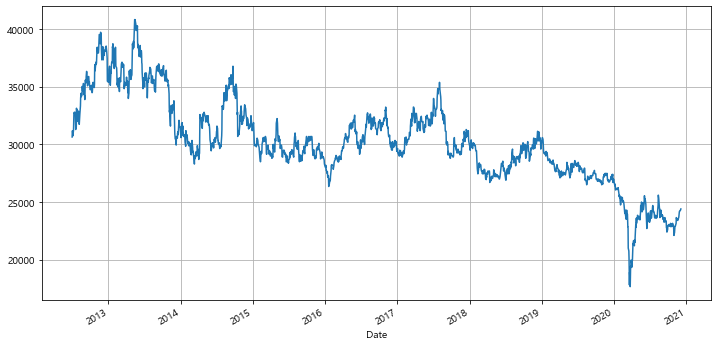

In [142]:
kt.Close.plot(figsize=(12,6), grid=True)
plt.show()

In [143]:
kt_trunc = kt[:'2020-06-30']
kt_trunc.tail()

,High,Low,Open,Close,Volume,Adj Close
Date,,,,,,
2020-06-24,24050.0,23800.0,23950.0,23800.0,625959.0,23800.0
2020-06-25,23800.0,23300.0,23500.0,23300.0,720134.0,23300.0
2020-06-26,24050.0,23200.0,23400.0,23700.0,1028894.0,23700.0
2020-06-29,23600.0,23150.0,23350.0,23250.0,696872.0,23250.0
2020-06-30,23650.0,23300.0,23350.0,23550.0,582065.0,23550.0


In [144]:
df4 = pd.DataFrame({'ds': kt_trunc.index, 'y': kt_trunc.Close})
df4.reset_index(inplace=True)
del df4['Date']
df4.head()

,ds,y
0,2012-07-02,30650.0
1,2012-07-03,31150.0
2,2012-07-04,31200.0
3,2012-07-05,30950.0
4,2012-07-06,30750.0


In [145]:
model = Prophet(daily_seasonality=True)
model.fit(df4)

In [146]:
future = model.make_future_dataframe(periods=157)
future.tail()

,ds
2113,2020-11-30
2114,2020-12-01
2115,2020-12-02
2116,2020-12-03
2117,2020-12-04


In [147]:
forecast = model.predict(future)

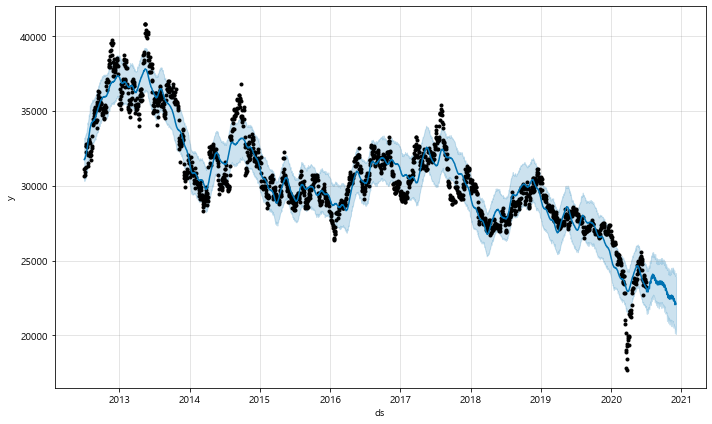

In [148]:
model.plot(forecast);

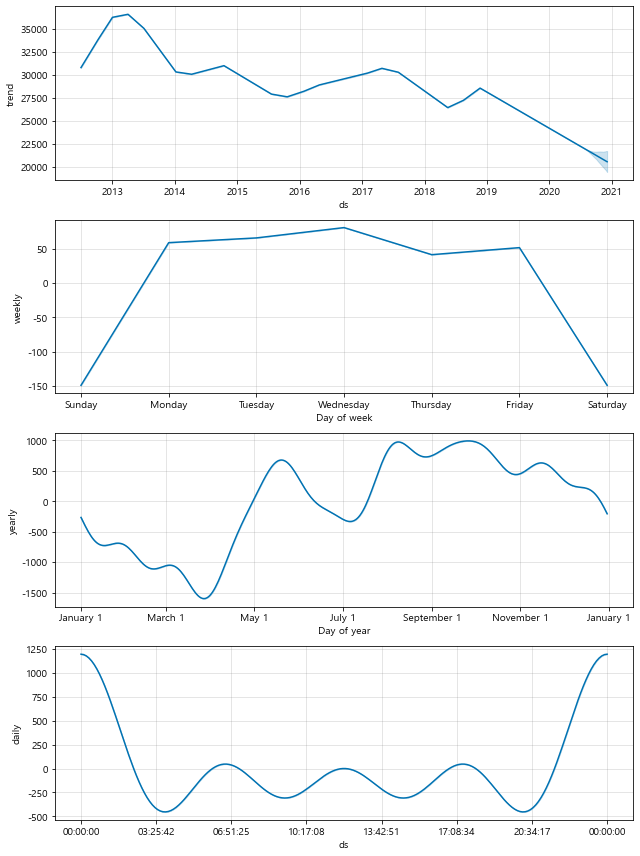

In [149]:
model.plot_components(forecast);

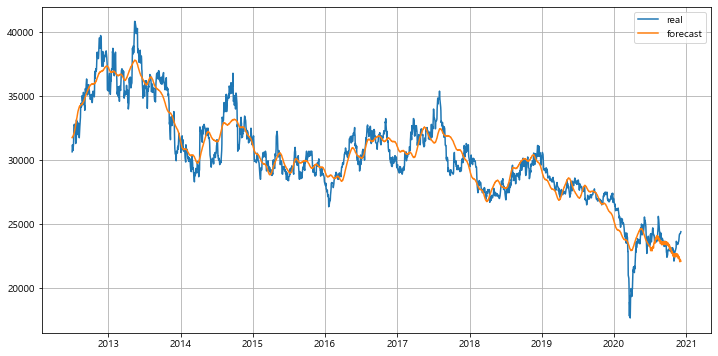

In [150]:
plt.figure(figsize=(12,6))
plt.plot(kt.index, kt.Close, label='real')
plt.plot(forecast.ds, forecast.yhat, label='forecast')
plt.grid()
plt.legend()
plt.show()

### ⑤ 종근당홀딩스

In [152]:
start = datetime(2012, 1, 1)
end = datetime(2020, 12, 4)
jh = pdr.DataReader('001630.KS', data_source='yahoo', start=start, end=end)
jh.head()

,High,Low,Open,Close,Volume,Adj Close
Date,,,,,,
2012-01-02,13736.500000,13279.799805,13385.200195,13596.000000,82380.0,11984.006836
2012-01-03,13806.799805,13490.599609,13806.799805,13701.400391,93112.0,12076.910156
2012-01-04,13771.599609,13350.099609,13631.099609,13385.200195,64965.0,11798.199219
2012-01-05,13525.700195,13279.799805,13350.099609,13490.599609,45443.0,11891.103516
2012-01-06,13947.299805,13279.799805,13560.900391,13947.299805,166661.0,12293.654297


In [153]:
jh.tail()

,High,Low,Open,Close,Volume,Adj Close
Date,,,,,,
2020-11-30,117000.0,106000.0,108000.0,111000.0,770645.0,111000.0
2020-12-01,115500.0,106500.0,109500.0,109000.0,297273.0,109000.0
2020-12-02,112500.0,108000.0,112500.0,108500.0,82270.0,108500.0
2020-12-03,111500.0,106500.0,108500.0,108500.0,93460.0,108500.0
2020-12-04,111500.0,108500.0,109000.0,110000.0,87172.0,110000.0


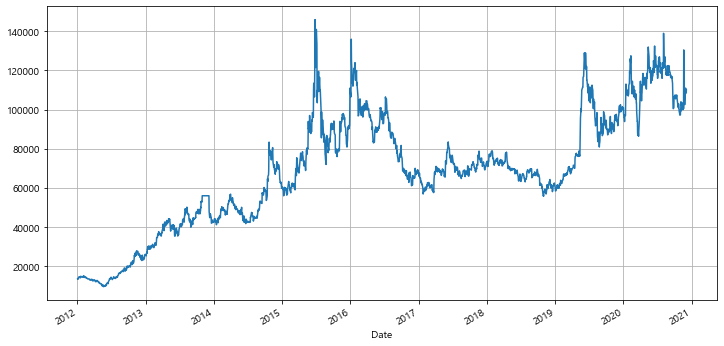

In [154]:
jh.Close.plot(figsize=(12,6), grid=True)
plt.show()

In [155]:
jh_trunc = jh[:'2020-08-31']
jh_trunc.tail()

,High,Low,Open,Close,Volume,Adj Close
Date,,,,,,
2020-08-25,122500.0,118000.0,119500.0,122500.0,24806.0,122500.0
2020-08-26,123000.0,118000.0,123000.0,121000.0,26614.0,121000.0
2020-08-27,121500.0,118000.0,121000.0,119000.0,29473.0,119000.0
2020-08-28,120000.0,117000.0,119000.0,117500.0,25487.0,117500.0
2020-08-31,124500.0,117500.0,121000.0,121000.0,69552.0,121000.0


In [156]:
df5 = pd.DataFrame({'ds': jh_trunc.index, 'y': jh_trunc.Close})
df5.reset_index(inplace=True)
del df5['Date']
df5.head()

,ds,y
0,2012-01-02,13596.000000
1,2012-01-03,13701.400391
2,2012-01-04,13385.200195
3,2012-01-05,13490.599609
4,2012-01-06,13947.299805


In [157]:
model = Prophet(daily_seasonality=True)
model.fit(df5)

In [159]:
future = model.make_future_dataframe(periods=95)
future.tail()

,ds
2217,2020-11-30
2218,2020-12-01
2219,2020-12-02
2220,2020-12-03
2221,2020-12-04


In [160]:
forecast = model.predict(future)

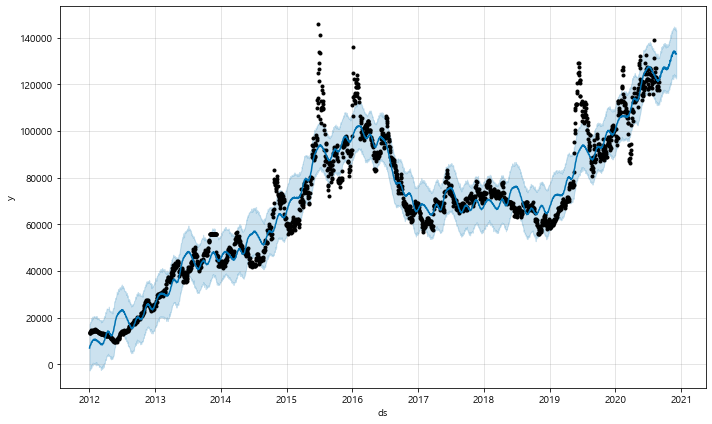

In [161]:
model.plot(forecast);

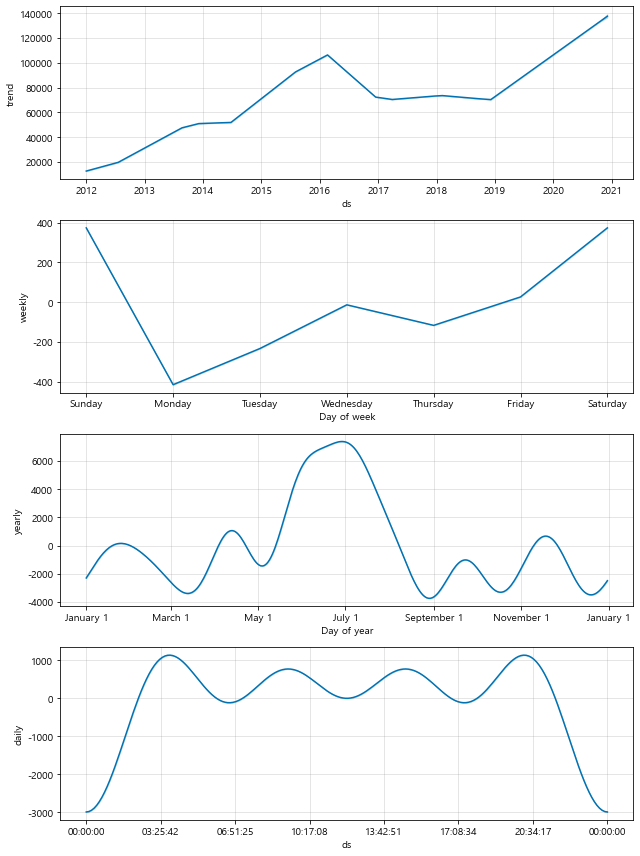

In [162]:
model.plot_components(forecast);

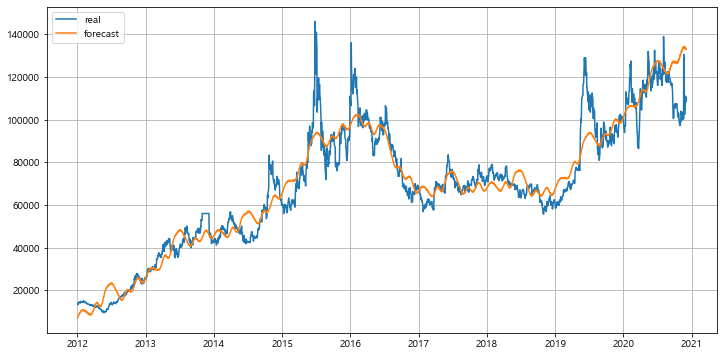

In [163]:
plt.figure(figsize=(12,6))
plt.plot(jh.index, jh.Close, label='real')
plt.plot(forecast.ds, forecast.yhat, label='forecast')
plt.grid()
plt.legend()
plt.show()

### ⑥ 오뚜기

In [164]:
start = datetime(2001, 1, 1)
end = datetime(2020, 12, 4)
ottogi = pdr.DataReader('007310.KS', data_source='yahoo', start=start, end=end)
ottogi.head()

,High,Low,Open,Close,Volume,Adj Close
Date,,,,,,
2001-01-02,13900.0,13050.0,13100.0,13900.0,3200.0,10529.600586
2001-01-03,13700.0,13300.0,13300.0,13600.0,8000.0,10302.342773
2001-01-04,14000.0,13450.0,13900.0,13650.0,13400.0,10340.221680
2001-01-05,13900.0,13400.0,13700.0,13450.0,7600.0,10188.713867
2001-01-08,14000.0,13300.0,13700.0,13450.0,14400.0,10188.713867


In [165]:
ottogi.tail()

,High,Low,Open,Close,Volume,Adj Close
Date,,,,,,
2020-11-30,567000.0,554000.0,563000.0,556000.0,15746.0,556000.0
2020-12-01,561000.0,551000.0,561000.0,558000.0,4273.0,558000.0
2020-12-02,559000.0,552000.0,558000.0,558000.0,4633.0,558000.0
2020-12-03,558000.0,552000.0,554000.0,558000.0,3726.0,558000.0
2020-12-04,560000.0,553000.0,558000.0,554000.0,5097.0,554000.0


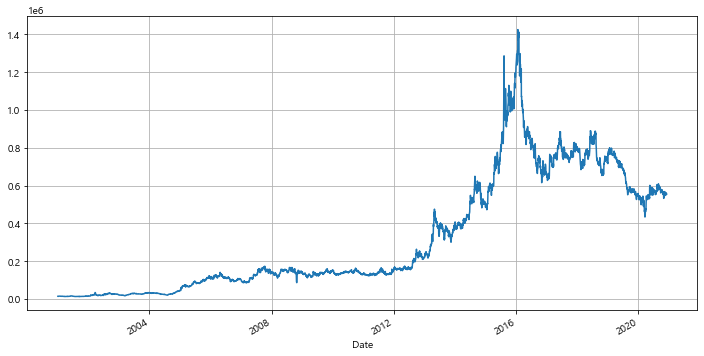

In [166]:
ottogi.Close.plot(figsize=(12, 6), grid=True)
plt.show()

In [167]:
ottogi_trunc = ottogi[:'2020-06-30']
ottogi_trunc.tail()

,High,Low,Open,Close,Volume,Adj Close
Date,,,,,,
2020-06-24,578000.0,569000.0,576000.0,572000.0,4569.0,572000.0
2020-06-25,571000.0,558000.0,565000.0,559000.0,5831.0,559000.0
2020-06-26,564000.0,556000.0,561000.0,560000.0,3238.0,560000.0
2020-06-29,560000.0,551000.0,551000.0,551000.0,3808.0,551000.0
2020-06-30,561000.0,555000.0,555000.0,557000.0,2867.0,557000.0


In [168]:
df6 = pd.DataFrame({'ds': ottogi_trunc.index, 'y': ottogi_trunc.Close})
df6.reset_index(inplace=True)
del df6['Date']
df6.head()

,ds,y
0,2001-01-02,13900.0
1,2001-01-03,13600.0
2,2001-01-04,13650.0
3,2001-01-05,13450.0
4,2001-01-08,13450.0


In [169]:
model = Prophet(daily_seasonality=True)
model.fit(df6)

In [170]:
future = model.make_future_dataframe(periods=157)
future.tail()

,ds
5005,2020-11-30
5006,2020-12-01
5007,2020-12-02
5008,2020-12-03
5009,2020-12-04


In [171]:
forecast = model.predict(future)

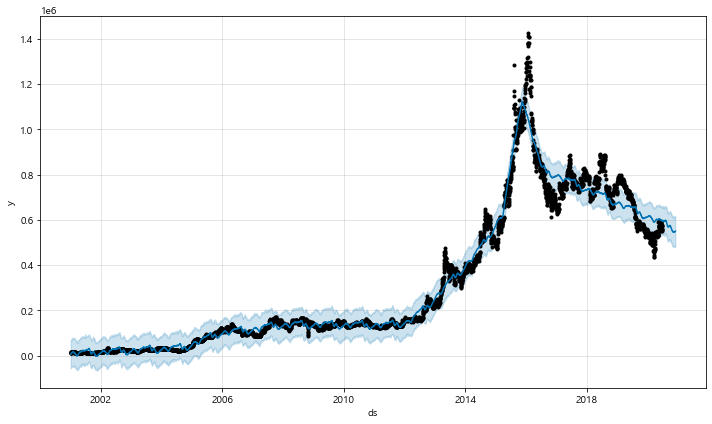

In [172]:
model.plot(forecast);

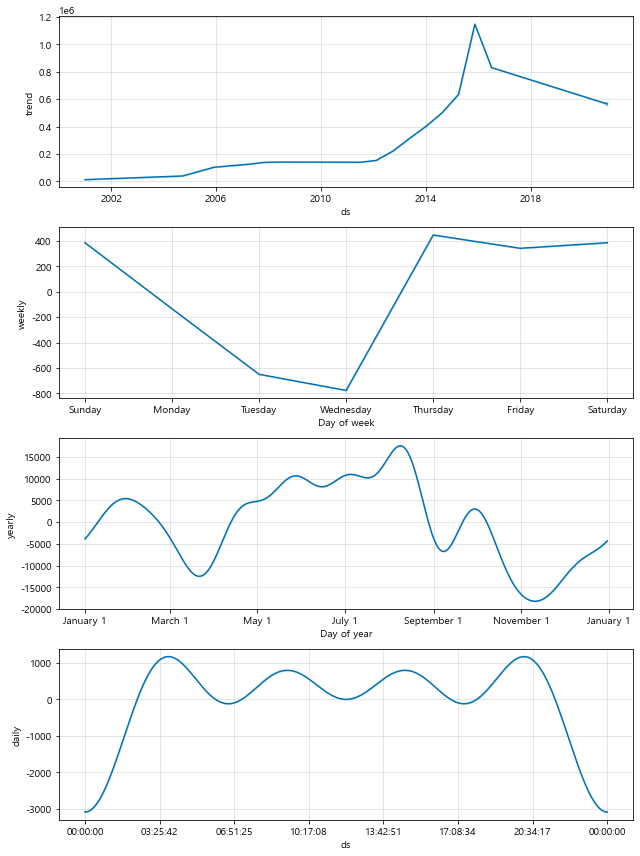

In [173]:
model.plot_components(forecast);

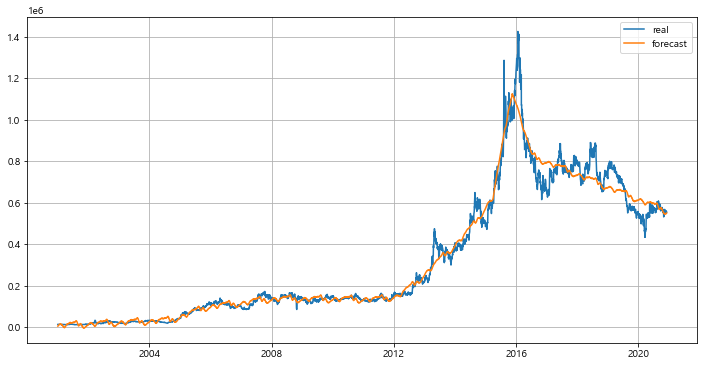

In [174]:
plt.figure(figsize=(12, 6))
plt.plot(ottogi.index, ottogi.Close, label='real')
plt.plot(forecast.ds, forecast.yhat, label='forecast')
plt.grid()
plt.legend()
plt.show()

### ⑦ 더존비즈온

In [188]:
start = datetime(2001, 1, 1)
end = datetime(2020, 12, 4)
douzone = pdr.DataReader('012510.KS', data_source='yahoo', start=start, end=end)
douzone.head()

,High,Low,Open,Close,Volume,Adj Close
Date,,,,,,
2001-01-02,4473.910156,4167.089844,4217.029785,4316.930176,5886.0,3901.760742
2001-01-03,4423.959961,4209.899902,4316.930176,4288.390137,18499.0,3875.965576
2001-01-04,4566.669922,4423.959961,4495.310059,4466.770020,13034.0,4037.189209
2001-01-05,4638.020020,4431.100098,4481.040039,4588.080078,13874.0,4146.833008
2001-01-08,4659.430176,4423.959961,4495.310059,4638.020020,3364.0,4191.969727


In [189]:
douzone.tail()

,High,Low,Open,Close,Volume,Adj Close
Date,,,,,,
2020-11-30,105500.0,101500.0,103000.0,105500.0,163823.0,105500.0
2020-12-01,105500.0,104000.0,104500.0,105000.0,53279.0,105000.0
2020-12-02,105500.0,104000.0,105000.0,105000.0,83091.0,105000.0
2020-12-03,105500.0,102000.0,104500.0,102000.0,116353.0,102000.0
2020-12-04,103000.0,100500.0,103000.0,100500.0,146014.0,100500.0


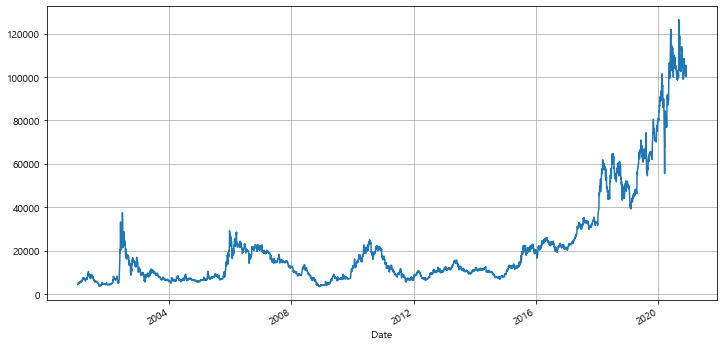

In [190]:
douzone.Close.plot(figsize=(12, 6), grid=True)
plt.show()

In [191]:
douzone_trunc = douzone[:'2020-06-30']
douzone_trunc.tail()

,High,Low,Open,Close,Volume,Adj Close
Date,,,,,,
2020-06-24,114000.0,108000.0,114000.0,108500.0,216662.0,108500.0
2020-06-25,107500.0,103500.0,106500.0,104500.0,208624.0,104500.0
2020-06-26,106500.0,101000.0,106500.0,102500.0,192825.0,102500.0
2020-06-29,104000.0,101500.0,102500.0,102500.0,90524.0,102500.0
2020-06-30,105500.0,101000.0,105500.0,102000.0,113383.0,102000.0


In [192]:
df7 = pd.DataFrame({'ds': douzone_trunc.index, 'y': douzone_trunc.Close})
df7.reset_index(inplace=True)
del df7['Date']
df7.head()

,ds,y
0,2001-01-02,4316.930176
1,2001-01-03,4288.390137
2,2001-01-04,4466.770020
3,2001-01-05,4588.080078
4,2001-01-08,4638.020020


In [193]:
model = Prophet(daily_seasonality=True)
model.fit(df7)

In [194]:
future = model.make_future_dataframe(periods=157)
future.tail()

,ds
4934,2020-11-30
4935,2020-12-01
4936,2020-12-02
4937,2020-12-03
4938,2020-12-04


In [195]:
forecast = model.predict(future)

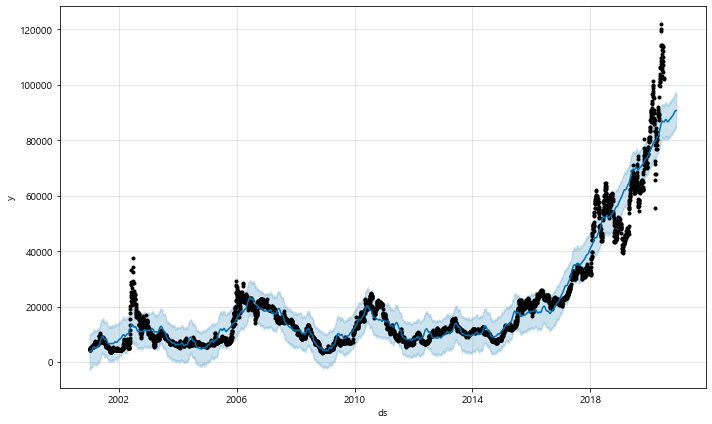

In [196]:
model.plot(forecast);

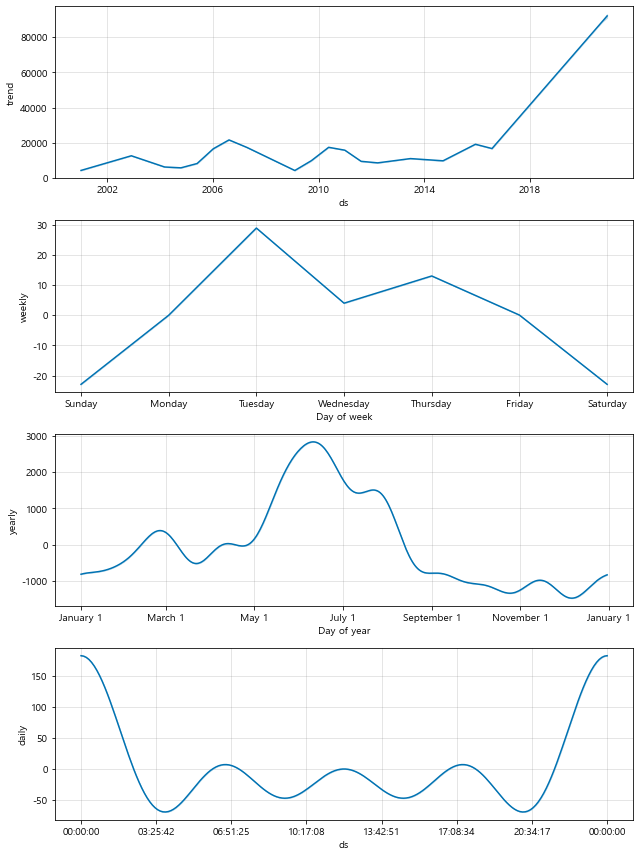

In [197]:
model.plot_components(forecast);

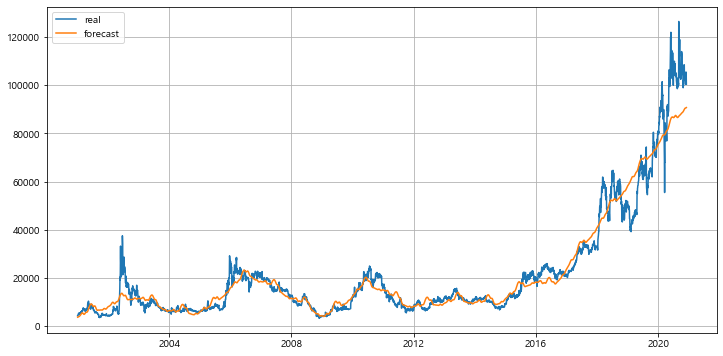

In [198]:
plt.figure(figsize=(12, 6))
plt.plot(douzone.index, douzone.Close, label='real')
plt.plot(forecast.ds, forecast.yhat, label='forecast')
plt.grid()
plt.legend()
plt.show()